# Importing necessary libraries

In [24]:
import pandas as pd 
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
from sklearn.linear_model import Ridge,Lasso,RidgeCV,LassoCV,ElasticNet,ElasticNetCV,LinearRegression
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()  # Apply the default seaborn theme, scaling, and color palette.

# A function to create adjusted R-squared

In [2]:
def adj_r2(x,y):
    r2=regression.score(x,y)
    n=x.shape[0]    #n is number of records
    p=x.shape[1]    #p is number of variables
    adjusted_r2=1-(1-r2)*(n-1)/(n-p-1)
    return adjusted_r2

# Importing the dataset

In [3]:
data=pd.read_csv("C:/Users/arpan/Downloads/Admission_Prediction.csv")
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)
data

,Serial No.,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
0,1,337.0,118.0,4.0,4.5,4.5,9.65,1,0.92
1,2,324.0,107.0,4.0,4.0,4.5,8.87,1,0.76
2,3,NaN,104.0,3.0,3.0,3.5,8.00,1,0.72
3,4,322.0,110.0,3.0,3.5,2.5,8.67,1,0.80
4,5,314.0,103.0,2.0,2.0,3.0,8.21,0,0.65
5,6,330.0,115.0,5.0,4.5,3.0,9.34,1,0.90
6,7,321.0,109.0,NaN,3.0,4.0,8.20,1,0.75
7,8,308.0,101.0,2.0,3.0,4.0,7.90,0,0.68
8,9,302.0,102.0,1.0,2.0,1.5,8.00,0,0.50
9,10,323.0,108.0,3.0,3.5,3.0,8.60,0,0.45


# Data understanding

In [4]:
from pandas_profiling import ProfileReport
pf = ProfileReport(data, title="Pandas Profiling Report", explorative=True)
pf

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Points to be noted
- No duplicate nows
- GRE Score has 15 missing values
- TOEFL Score has 10 missing values
- University Rating has 15 missing values
- The Mean and 50% (Median) of all Numerical(Cont) Cols are quite close to each other that means very less outliers are present.

# Normality Check of the data

In [5]:
def skw_krt(data):
    print("1. Skewness of every variables are: ",'\n',data.skew().abs())
    print("")
    print("2. Kurtosis of every variables are: ",'\n',data.kurtosis().abs())
    print("")
    return

In [6]:
skw_krt(data)

1. Skewness of every variables are:  
 Serial No.           0.000000
GRE Score            0.051687
TOEFL Score          0.102068
University Rating    0.091057
SOP                  0.228972
LOR                  0.145290
CGPA                 0.026613
Research             0.242475
Chance of Admit      0.289966
dtype: float64

2. Kurtosis of every variables are:  
 Serial No.           1.200000
GRE Score            0.684467
TOEFL Score          0.664565
University Rating    0.834045
SOP                  0.705717
LOR                  0.745749
CGPA                 0.561278
Research             1.949018
Chance of Admit      0.454682
dtype: float64



Skewness of all Cols are in between 0 to 1 and Kurtosis of all Cols are in between 0 to 3 that means the Cols are normally distributed

## Checking the Distribution of the Columns having Missing Values

C:\Users\arpan\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



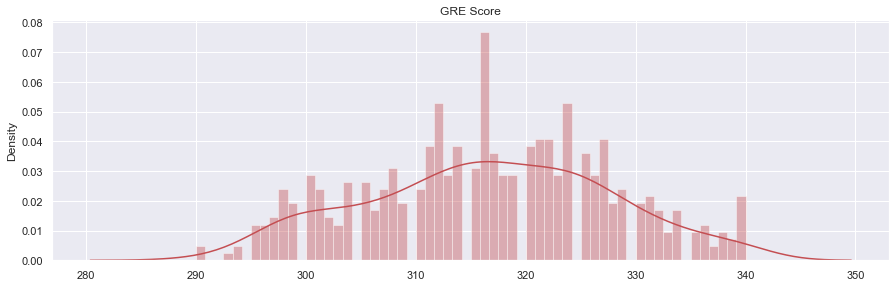

C:\Users\arpan\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



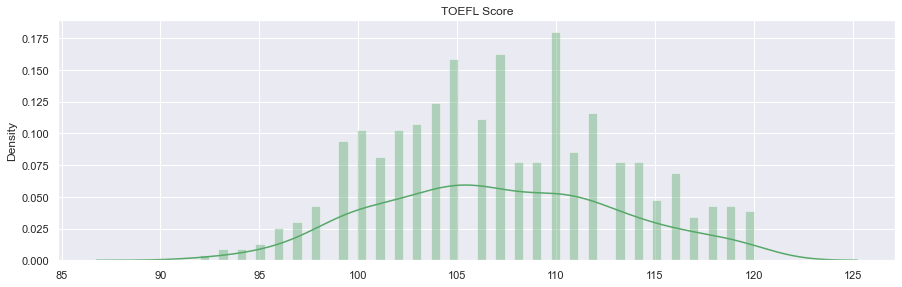

C:\Users\arpan\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



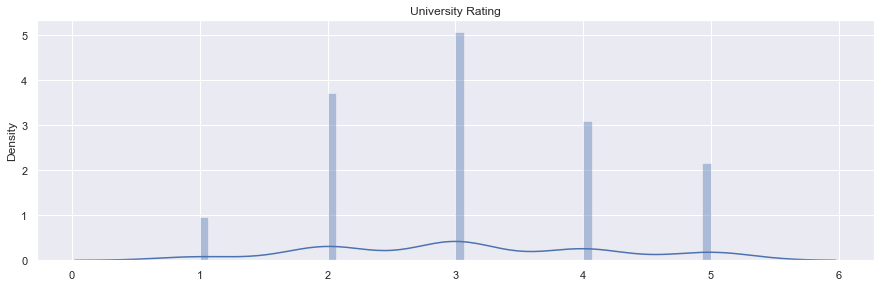

In [26]:
#miss_value_col = ["GRE Score","TOEFL Score","University Rating"]

# Univariate dist plot which contain both kde and hist to Check Normality

plt.figure(figsize= (15,15))
plt.subplot(311)
sns.distplot(data[["GRE Score"]],bins=60,color = 'r').set_title("GRE Score")
print('')
plt.show()
plt.figure(figsize= (15,15))
plt.subplot(312)
sns.distplot(data[["TOEFL Score"]],bins=60,color = 'g').set_title("TOEFL Score")
print('')
plt.show()
plt.figure(figsize= (15,15))
plt.subplot(313)
sns.distplot(data[["University Rating"]],bins=60).set_title("University Rating")
plt.show()

In [8]:
#dropping Serial no col as its of no use
data.drop("Serial No.",axis=1,inplace=True)
data.head()

,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
0,337.0,118.0,4.0,4.5,4.5,9.65,1,0.92
1,324.0,107.0,4.0,4.0,4.5,8.87,1,0.76
2,NaN,104.0,3.0,3.0,3.5,8.00,1,0.72
3,322.0,110.0,3.0,3.5,2.5,8.67,1,0.80
4,314.0,103.0,2.0,2.0,3.0,8.21,0,0.65


## Filling the Missing Values based on the following points:

- University Rating : It is a categorical feature so we will fill it with Mode
- TOEFL Score : It is a Numerical feature (Continuous) so we will fill it with Mean
- GRE Score : It is a Numerical feature (Continuous) so we will fill it with Mean

In [9]:
data["University Rating"]=data["University Rating"].fillna(data["University Rating"].mode()[0])

In [10]:
data["University Rating"].isnull().sum()

0

In [11]:
data["GRE Score"]=data["GRE Score"].fillna(data["GRE Score"].mean())

In [12]:
data["GRE Score"].isnull().sum()

0

In [13]:
data["TOEFL Score"]=data["TOEFL Score"].fillna(data["TOEFL Score"].mean())

In [14]:
data["TOEFL Score"].isnull().sum()

0

In [15]:
data.isna().sum()

GRE Score            0
TOEFL Score          0
University Rating    0
SOP                  0
LOR                  0
CGPA                 0
Research             0
Chance of Admit      0
dtype: int64

There are no missing values in the dataset


In [16]:
skw_krt(data)

1. Skewness of every variables are:  
 GRE Score            0.052475
TOEFL Score          0.103098
University Rating    0.102097
SOP                  0.228972
LOR                  0.145290
CGPA                 0.026613
Research             0.242475
Chance of Admit      0.289966
dtype: float64

2. Kurtosis of every variables are:  
 GRE Score            0.612458
TOEFL Score          0.616646
University Rating    0.766867
SOP                  0.705717
LOR                  0.745749
CGPA                 0.561278
Research             1.949018
Chance of Admit      0.454682
dtype: float64



## Outlier Detection using Univariate Box Plot:

In [17]:
def box_plot(data):
    import plotly.express as px
    for i in data.columns:
        fig = px.box(data, y = i, width=500, height=500,title = "The Boxplot for " + i,template="plotly_dark")
        
        fig.show()
        
    return
        

In [18]:
box_plot(data)

No such outliers.. We are good to go....

## Let's visualize the data and analyze the relationship between all Columns

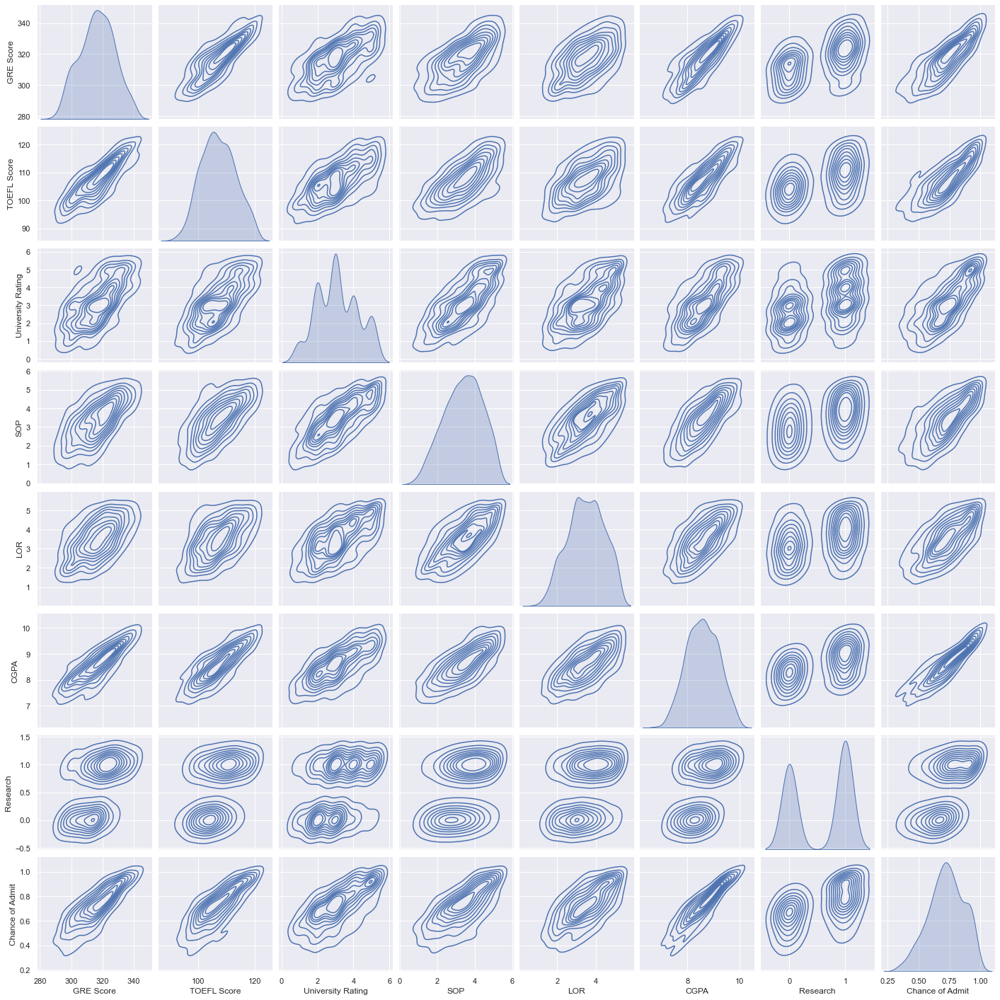

In [25]:
sns.pairplot(data,kind="kde")

# Let's observe the relationship between independent variables and dependent variable.

In [20]:
y=data["Chance of Admit"]
X=data.drop("Chance of Admit",axis=1)

In [21]:
X.head()

,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research
0,337.000000,118.0,4.0,4.5,4.5,9.65,1
1,324.000000,107.0,4.0,4.0,4.5,8.87,1
2,316.558763,104.0,3.0,3.0,3.5,8.00,1
3,322.000000,110.0,3.0,3.5,2.5,8.67,1
4,314.000000,103.0,2.0,2.0,3.0,8.21,0


In [22]:
y.head()

0    0.92
1    0.76
2    0.72
3    0.80
4    0.65
Name: Chance of Admit, dtype: float64

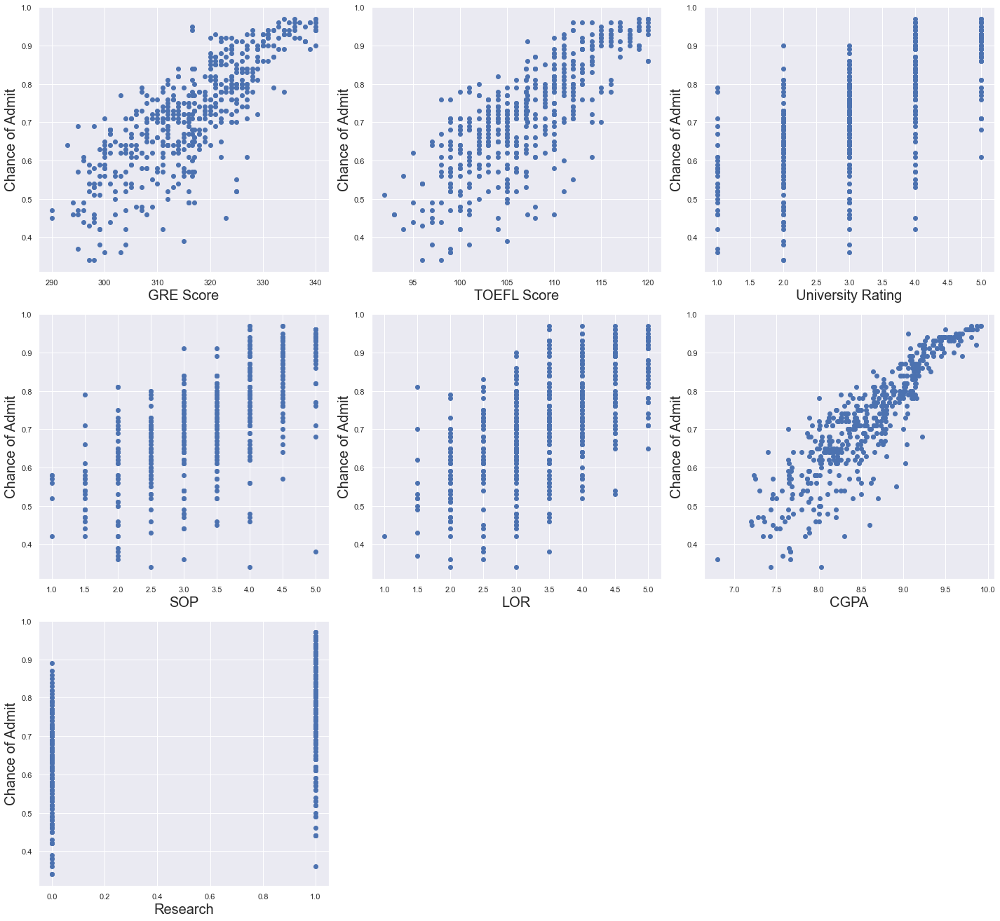

In [27]:
plt.figure(figsize=(20,30), facecolor='white')
plotnumber = 1

for column in X:
    if plotnumber<=15 :
        ax = plt.subplot(5,3,plotnumber)
        plt.scatter(X[column],y)
        plt.xlabel(column,fontsize=20)
        plt.ylabel('Chance of Admit',fontsize=20)
    plotnumber+=1
plt.tight_layout()

# Normalizing the data and checking multicollinearity

In [28]:
scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)

In [29]:
X_scaled[0]

array([1.84274116, 1.78854223, 0.78200955, 1.13735981, 1.09894429,
       1.77680627, 0.88640526])

In [30]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
variables=X_scaled
# we create a new data frame which will include all the VIFs
# note that each variable has its own variance inflation factor as this measure is variable specific (not model specific)
# we do not include categorical values for mulitcollinearity as they do not provide much information as numerical ones do
vif = pd.DataFrame()

# here we make use of the variance_inflation_factor, which will basically output the respective VIFs 
vif["VIF"] = [variance_inflation_factor(variables, i) for i in range(variables.shape[1])]
# Finally, I like to include names so it is easier to explore the result
vif["Features"] = X.columns

In [31]:
vif

,VIF,Features
0,4.152735,GRE Score
1,3.793345,TOEFL Score
2,2.517272,University Rating
3,2.776393,SOP
4,2.037449,LOR
5,4.654369,CGPA
6,1.459411,Research


Here, we have the correlation values for all the features. As a thumb rule, a VIF value greater than 5 means a very severe multicollinearity. We don't any VIF greater than 5 , so we are good to go. 

## Great. Let's go ahead and use linear regression and see how good it fits our data. But first. let's split our data in train and test.

In [65]:
x_train,x_test,y_train,y_test = train_test_split(X_scaled,y,test_size = 0.25,random_state=355)

In [66]:
y_train

378    0.56
23     0.95
122    0.57
344    0.47
246    0.72
409    0.61
197    0.73
116    0.56
83     0.92
91     0.38
106    0.87
258    0.77
444    0.92
304    0.62
12     0.78
392    0.84
462    0.62
204    0.69
250    0.74
370    0.72
313    0.67
126    0.85
424    0.91
457    0.37
100    0.71
17     0.65
140    0.84
40     0.46
279    0.67
64     0.52
27     0.44
47     0.89
110    0.61
413    0.49
198    0.70
471    0.64
66     0.61
165    0.78
224    0.67
277    0.70
144    0.80
448    0.80
247    0.71
350    0.74
435    0.55
189    0.88
93     0.44
103    0.57
139    0.78
358    0.70
132    0.71
366    0.74
455    0.59
226    0.63
302    0.65
363    0.69
21     0.70
327    0.69
78     0.44
98     0.90
408    0.57
388    0.49
395    0.82
268    0.83
52     0.78
300    0.62
248    0.80
30     0.65
483    0.71
391    0.71
477    0.65
18     0.63
418    0.60
440    0.53
309    0.70
175    0.85
227    0.64
467    0.78
183    0.75
1      0.76
324    0.67
356    0.79
163    0.68
478 

In [67]:
regression=LinearRegression()
regression.fit(x_train,y_train)

LinearRegression()

# Saving the model to the local system

In [68]:
import pickle
filename="finalized.pickle"
pickle.dump(regression,open(filename,"wb"))

# Prediction of a single row using the saved model

In [69]:
loaded_model=pickle.load(open(filename,"rb"))
a=loaded_model.predict(scaler.transform([[302.0,102.0,1.0,2.0,1.5,8.00,0]]))
a

array([0.55460481])

In original dataset the "chance of admission" value for this row was 0.5, and ours predicted value is 0.55  we are close enough

# Checking R-Square and Adj- R Square for Training Datasets

In [70]:
regression.intercept_

0.7232045728172708

In [71]:
regression.score(x_train,y_train)    #R square value

0.8415250484247909

In [72]:
adj_r2(x_train,y_train)              #adjusted R square value from our user defined function

0.8385023654247188

Our r2 score is 84.15% and adj r2 is 83.8% for our training et., so looks like we are not being penalized by use of any feature.

## Let's check how well model fits the test data.

In [73]:
loaded_model=pickle.load(open(filename,"rb"))
y_pred=loaded_model.predict(x_test)
temp_dict={"Y_Test":y_test,"Predicted values":y_pred}
temp_df=pd.DataFrame(temp_dict)
temp_df

,Y_Test,Predicted values
28,0.46,0.426711
382,0.82,0.840992
342,0.58,0.639163
311,0.84,0.849607
212,0.95,0.972428
295,0.68,0.678156
167,0.64,0.644715
205,0.57,0.517189
294,0.61,0.656461
347,0.42,0.437799


The result looks quite close to each other

## Now let's check if our model is overfitting using R2 and Adj_R2. using Testing Dataset

In [74]:
regression.score(x_test,y_test)

0.7534898831471066

In [75]:
adj_r2(x_test,y_test)

0.7387414146174464

So it looks like our model r2 score is less on the test data.

## Let's see if our model is overfitting our training data using Regularization Techniques

In [86]:
#lasso Regularization
#LassoCV will return the best alpha and coefficients after performing 10 cross validations
lasscv=LassoCV(alphas=None,cv=10,max_iter=1000,normalize=True)
lasscv.fit(x_train,y_train)

LassoCV(cv=10, normalize=True)

In [87]:
#best alpha parameter
alpha=lasscv.alpha_
alpha

3.0341655445178153e-05

In [88]:
#now that we have best parameter, let's use Lasso regression and see how well our data has fitted before
lasso_reg=Lasso(alpha)
lasso_reg.fit(x_train,y_train)

Lasso(alpha=3.0341655445178153e-05)

In [89]:
lasso_reg.score(x_train,y_train)

0.841524969566963

In [90]:
lasso_reg.score(x_test,y_test)

0.7534654960492284

our r2_score for test data (75.34%) comes same as before using regularization. So, it is fair to say our SK model did not overfit the data.

In [130]:
# Using Ridge regression model
# RidgeCV will return best alpha and coefficients after performing 10 cross validations. 
# We will pass an array of random numbers for ridgeCV to select best alpha from them
import random
random.seed(10)
alphas = np.random.uniform(low=0, high=10, size=(50,))
random.seed(10)
ridgecv = RidgeCV(alphas = alphas,cv=10,normalize = True)
ridgecv.fit(x_train, y_train)

RidgeCV(alphas=array([0.45928635, 4.03938389, 7.38247713, 3.61137858, 0.76120997,
       6.15905471, 4.78855333, 9.90203232, 7.10526057, 6.55837043,
       4.60986238, 7.61771635, 7.65081975, 7.40310074, 3.64030178,
       9.80679872, 1.43580332, 6.61498092, 1.52177722, 7.20309197,
       1.16509418, 1.42641741, 8.93919627, 6.68937846, 6.99609584,
       2.22594266, 8.84453606, 2.69054678, 8.51351797, 9.880045  ,
       1.3262038 , 4.64907026, 3.77223567, 6.75798526, 2.11113484,
       9.16639753, 1.64917106, 7.31160536, 8.07877768, 6.43803896,
       5.97058402, 2.39309388, 3.48383961, 3.98327647, 7.24114509,
       0.59944039, 4.04320235, 1.02674125, 2.43914703, 9.69196122]),
        cv=10, normalize=True)

In [131]:
ridgecv.alpha_

0.45928635358278513

In [132]:
ridge_model = Ridge(alpha=ridgecv.alpha_)
ridge_model.fit(x_train, y_train)

Ridge(alpha=0.45928635358278513)

In [133]:
ridge_model.score(x_test, y_test)

0.7537124350579059

we got the same r2 square using Ridge regression as well. So, it's safe to say there is no overfitting.

In [134]:
#Elastic net
elasticCV=ElasticNetCV(alphas=None,cv=10,normalize=True)
elasticCV.fit(x_train,y_train)

ElasticNetCV(cv=10, normalize=True)

In [135]:
elasticCV.alpha_

6.0683310890356314e-05

In [136]:
# l1_ratio gives how close the model is to L1 regularization, below value indicates we are giving equal
#preference to L1 and L2
elasticCV.l1_ratio

0.5

In [137]:
elasticnet_reg=ElasticNet(alpha=elasticCV.alpha_,l1_ratio=0.5)
elasticnet_reg.fit(x_train,y_train)

ElasticNet(alpha=6.0683310890356314e-05)

In [138]:
elasticnet_reg.score(x_test,y_test)

0.7534710950712854

So, we can see by using different type of regularization, we still are getting the same r2 score. That means our OLS model has been well trained over the training data and there is no overfitting.

### Now creating Model Using StatsModel

In [139]:
X_scaled = pd.DataFrame(X_scaled, columns = ['GRE Score','TOEFL Score','University Rating','SOP','LOR','CGPA','Research'])
#print(f"Independent Variables : {X_scaled}")
#print(f"Dependent Variable : {y[0]}")
X_scaled.head()

,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research
0,1.842741e+00,1.788542,0.782010,1.137360,1.098944,1.776806,0.886405
1,6.708143e-01,-0.031058,0.782010,0.632315,1.098944,0.485859,0.886405
2,5.124333e-15,-0.527313,-0.104623,-0.377773,0.017306,-0.954043,0.886405
3,4.905178e-01,0.465197,-0.104623,0.127271,-1.064332,0.154847,0.886405
4,-2.306679e-01,-0.692731,-0.991255,-1.387862,-0.523513,-0.606480,-1.128152


## We need to add the column of ones to the inputs if we want statsmodels to calculate the intercept 𝑏₀. 
### It doesn’t takes 𝑏₀ into account by default. This is just one function call:

In [140]:
# we need to add the column of ones to the inputs if we want statsmodels to calculate the intercept 𝑏₀. 
# It doesn’t takes 𝑏₀ into account by default. This is just one function call:
x = sm.add_constant(X_scaled)

In [141]:
x.head()

,const,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research
0,1.0,1.842741e+00,1.788542,0.782010,1.137360,1.098944,1.776806,0.886405
1,1.0,6.708143e-01,-0.031058,0.782010,0.632315,1.098944,0.485859,0.886405
2,1.0,5.124333e-15,-0.527313,-0.104623,-0.377773,0.017306,-0.954043,0.886405
3,1.0,4.905178e-01,0.465197,-0.104623,0.127271,-1.064332,0.154847,0.886405
4,1.0,-2.306679e-01,-0.692731,-0.991255,-1.387862,-0.523513,-0.606480,-1.128152


<AxesSubplot:>

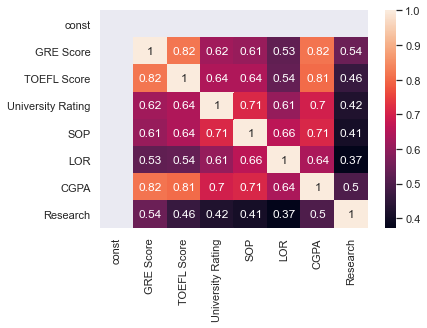

In [142]:
sns.heatmap(x.corr(method="pearson"),annot=True)

### Great. Let's go ahead and use linear regression and see how good it fits our data. But first. let's split our data in train and test.

In [143]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = 0.25,random_state=355)

## Create a model and fit it 

In [145]:
model=sm.OLS(y_train,x_train)
model_op=model.fit()
model_op

# MSE RMSE and R2

In [146]:
print("MSE : ",(model_op.ssr)/len(x))

MSE :  0.002361014766550679


In [147]:
print("RMSE : ",np.sqrt((model_op.ssr)/len(x)))

RMSE :  0.04859027440291606


In [148]:
print("r2 :",model_op.rsquared)

r2 : 0.8415250484247909


## Lets check the statsmodels summary

In [149]:
model_op.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        Chance of Admit   R-squared:                       0.842
Model:                            OLS   Adj. R-squared:                  0.839
Method:                 Least Squares   F-statistic:                     278.4
Date:                Wed, 23 Feb 2022   Prob (F-statistic):          1.43e-142
Time:                        17:38:28   Log-Likelihood:                 548.08
No. Observations:                 375   AIC:                            -1080.
Df Residuals:                     367   BIC:                            -1049.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.7232      0.003    246.433      0.000       0.717       0.729
GRE Score             0.0234      0.006      3.946      0.000       0.012       0.035
TOEFL Score           0.0113      0.006      1.916      0.056      -0.000       0.023
University Rating     0.0043      0.005      0.956      0.340      -0.005       0.013
SOP                   0.0014      0.005      0.302      0.763      -0.008       0.011
LOR                   0.0148      0.004      3.548      0.000       0.007       0.023
CGPA                  0.0788      0.006     12.452      0.000       0.066       0.091
Research              0.0099      0.004      2.786      0.006       0.003       0.017
==============================================================================
Omnibus:                       62.529   Durbin-Watson:                   1.845
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              124.660
Skew:                          -0.900   Prob(JB):                     8.52e-28
Kurtosis:                       5.178   Cond. No.                         5.40
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## Points Observed:

- R-squared: 0.842 and R-squared: 0.839 are quite close that means all features are signoficant.

- Compare the p-value(1.43e-142) for the F-test to your significance level(0.05). The p-value is less than the significance level, our sample data provide sufficient evidence to conclude that our regression model fits the data better than the model with no independent variables. This finding is good news because it means that the independent variables in our model improve the fit!


Let's drop University Rating and SOP column as their p value is greater than 0.05, thus conlcuding its not a significant variable

In [151]:
x.drop(["University Rating","SOP"],axis=1,inplace=True)
x.head()

,const,GRE Score,TOEFL Score,LOR,CGPA,Research
0,1.0,1.842741e+00,1.788542,1.098944,1.776806,0.886405
1,1.0,6.708143e-01,-0.031058,1.098944,0.485859,0.886405
2,1.0,5.124333e-15,-0.527313,0.017306,-0.954043,0.886405
3,1.0,4.905178e-01,0.465197,-1.064332,0.154847,0.886405
4,1.0,-2.306679e-01,-0.692731,-0.523513,-0.606480,-1.128152


In [152]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = 0.25,random_state=355)

In [153]:
model=sm.OLS(y_train,x_train)
model_op=model.fit()
model_op

In [154]:
model_op.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        Chance of Admit   R-squared:                       0.841
Model:                            OLS   Adj. R-squared:                  0.839
Method:                 Least Squares   F-statistic:                     390.3
Date:                Wed, 23 Feb 2022   Prob (F-statistic):          6.81e-145
Time:                        17:44:51   Log-Likelihood:                 547.44
No. Observations:                 375   AIC:                            -1083.
Df Residuals:                     369   BIC:                            -1059.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.7233      0.003    246.829      0.000       0.718       0.729
GRE Score       0.0236      0.006      3.984      0.000       0.012       0.035
TOEFL Score     0.0125      0.006      2.162      0.031       0.001       0.024
LOR             0.0164      0.004      4.311      0.000       0.009       0.024
CGPA            0.0806      0.006     13.305      0.000       0.069       0.092
Research        0.0102      0.004      2.888      0.004       0.003       0.017
==============================================================================
Omnibus:                       61.117   Durbin-Watson:                   1.843
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              122.368
Skew:                          -0.879   Prob(JB):                     2.68e-27
Kurtosis:                       5.177   Cond. No.                         4.57
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

# Checking the Multicolinearity

In [155]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
variables = x.to_numpy()

# we create a new data frame which will include all the VIFs
# note that each variable has its own variance inflation factor as this measure is variable specific (not model specific)
# we do not include categorical values for mulitcollinearity as they do not provide much information as numerical ones do
vif = pd.DataFrame()

# here we make use of the variance_inflation_factor, which will basically output the respective VIFs 
vif["VIF"] = [variance_inflation_factor(variables, i) for i in range(variables.shape[1])]
# Finally, I like to include names so it is easier to explore the result
vif["Features"] = x.columns

In [156]:
vif

,VIF,Features
0,1.000000,const
1,4.144085,GRE Score
2,3.670205,TOEFL Score
3,1.699451,LOR
4,4.254480,CGPA
5,1.450780,Research


## Finalized Model after removing all insignificant features

In [157]:
y_pred=model_op.predict(x_test)

In [160]:
temp_dict={"Y_Test":y_test,"Predicted Values":y_pred}
temp_df=pd.DataFrame(temp_dict)
temp_df

,Y_Test,Predicted Values
28,0.46,0.426837
382,0.82,0.839594
342,0.58,0.637716
311,0.84,0.847962
212,0.95,0.975723
295,0.68,0.679584
167,0.64,0.644078
205,0.57,0.516971
294,0.61,0.657863
347,0.42,0.438332
